In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from sklearn.ensemble import RandomForestClassifier

# Задача №1 - Можете ли вы отличить сорняки от рассады?

Теперь приступим к задаче классификации на картинках. Реализуйте программу, которая определяет тип рассады на изображении. 

Для того, чтобы определить характерные особенности каждого типа рассады, у вас есть train. Train это папка, в которой картинки уже классифицированы и лежат в соответствующих папках. Исходя из этой информации можете найти признаки, присущие конкретному растению.

Проверка вашего решения будет на происходить на test. В папке test уже нет метки класса для каждой картинки. 

[Ссылка на Яндекс-диск](https://yadi.sk/d/0Zzp0klXT0iRmA), все картинки тут.

Примеры изображений для теста:
<table><tr>
    <td> <img src="https://i.ibb.co/tbqR37m/fhj.png" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/6yL3Wmt/sfg.png" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/pvn7NvF/asd.png" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

# Алгоритм
1)	Предобработка изображения `ф-ция transform()`:
>a.	Переведем изображения в hsv. 
<br/>b.	Удалим все кроме листочков. 
2)	Тренировка :
>a.	Берем тренировочный сет (уже без камешков) и ищем особые точки на каждой картинке. `ф-ция spec_points()`
<br/>b.	Берем SIFT дескрипторы этих точек. `ф-ция spec_points()`
<br/>c.	Загружаем дескрипторы в качестве фичей и номера классов в качестве таргетов в модельку, в нашем случае рандомный лес. `ф-ция identification()`
3)	Тесты :
>a.	Аналогично тренировочному сету чистим и находим особые точки с дескрипторами. `ф-ция spec_points()`
<br/>b.	Закидываем в лес и смотрим результат, надеясь на лучшее. `ф-ция identification()`
<br/>c.	Получаем неплохой результат)
  

In [37]:
def transform(image):
    """
    Функция предобработки изображения (в идеале оставляет только сами растения) 
    """
    
    im = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    h_im = im[:,:,0]
    h1 = h_im < 30
    h2 = h_im > 90
    
    v = im[:,:,2] > 150
    s = im[:,:,1] < 100
    im[:,:][h1 | h2 | v | s] = [0, 0, 0]
    
#     im[:,:][h1 | h2] = [0, 0, 0]
    return cv2.cvtColor(im, cv2.COLOR_HSV2RGB)

In [38]:
def spec_points(image):
    """
    Функция для поиска особых точек и получения их дескрипторов 
    """
    
    im = transform(image)
    hyp_params = dict(
        nfeatures = 100,
        nOctaveLayers = 10,
        contrastThreshold = 0.05,
        edgeThreshold = 6,
        sigma = 4.0)  # hyp params
    detector = cv2.SIFT_create(**hyp_params)

    _, desc = detector.detectAndCompute(im, None)
    try:
        return desc.astype(np.float32)
    except:
        return None

In [39]:
def identification(train, test):
    """
    Основная функция обучает на train и получает предсказания для test
    Возвращает список меток класса для test
    """
    
    ratio_thresh = 0.75
    FLANN_INDEX_KDTREE = 2
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    descs = []
    targets = []
    for i in range(len(train)):
        for im in train[i]:
            temp = list(spec_points(im))
            descs += temp
            targets += [i]*len(temp)
            
    forest = RandomForestClassifier(n_jobs=-1)
    forest.fit(np.array(descs),np.array(targets))
            
    inds_res = []
    for im in test:

        test_desc = spec_points(im)

        max_num = 0
        ind_res = 0

        preds = forest.predict(test_desc)
        values, counts = np.unique(preds, return_counts=True)
        inds_res.append(values[np.argmax(counts)])
    return inds_res

In [40]:
def get_test():
    """
    Функция достающая картинки из test
    """
    
    path = "./plants/test/"
    test = []
    for path_im in os.listdir(path):
        test.append(cv2.imread(path+path_im))
        test[-1] = cv2.cvtColor(test[-1], cv2.COLOR_BGR2RGB)
    return test

In [41]:
def get_train():
    """
    Функция достающая картинки из train
    """
    
    path = "./plants/train/"
    names = os.listdir(path)
    train = []
    for name in names:
        train.append([])
        for path_im in os.listdir(path+name):
            train[-1].append(cv2.imread(path+name+'/'+path_im))
#             print(train[-1][-1])
            train[-1][-1] = cv2.cvtColor(train[-1][-1], cv2.COLOR_BGR2RGB)
    return names, train

In [42]:
names, train = get_train()
test = get_test()

# чисто для проверки сам сделал (это то что должно получиться для теста)
res = [0, 0, 1, 1, 0, 0, 2, 3, 1, 0, 1, 1, 0, 3, 2, 3, 2, 3, 0, 3, 2, 2, \
       3, 1, 3, 2, 2, 1, 3, 3, 0, 2, 0, 0, 1, 2, 3, 2, 1, 1]
len(res)

40

In [43]:
max_len = 0
for i in range(len(train)):
    max_len = len(train[i]) if len(train[i]) > max_len else max_len

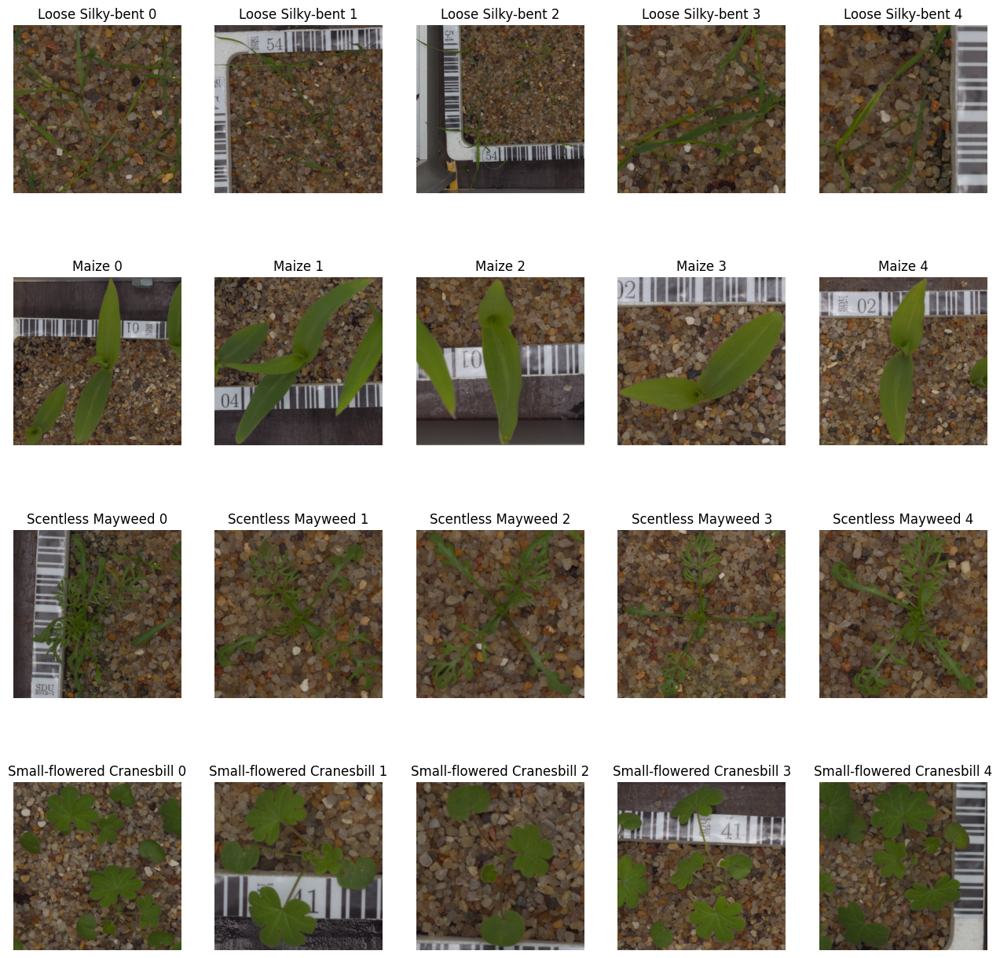

In [44]:
fig, axes = plt.subplots(len(train), max_len, figsize=(16, 16))

for i in range(len(train)):
    for j in range(len(train[i])):
        axes[i][j].imshow(train[i][j])
        axes[i][j].set_title(f'{names[i]} {j}')
        axes[i][j].axis('off')

In [47]:
inds_res = identification(train, test)
err = 0
for i in range(len(inds_res)):
    if inds_res[i] != res[i]:
        err += 1
print('Count errors: ', err)

Count errors:  0


Количество ошибок считается по тому, что я сам увидел (но вроде все правильно)

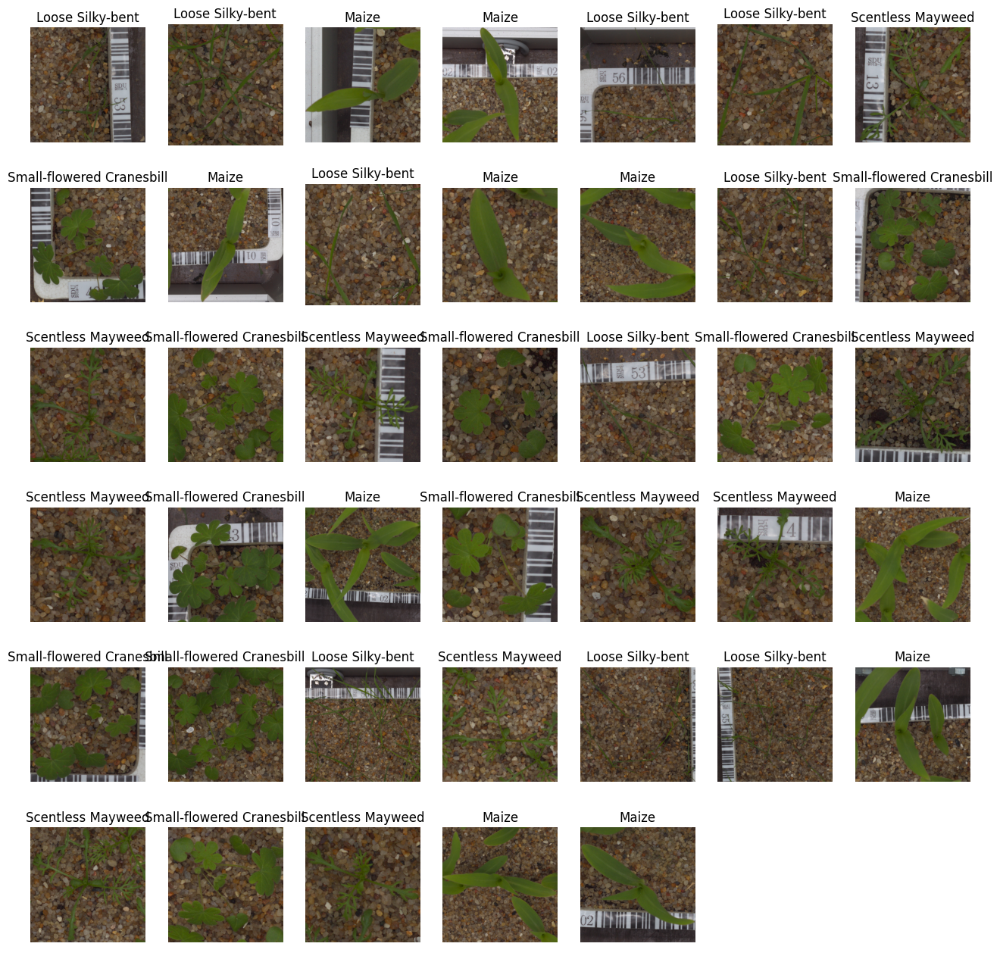

In [46]:
a = int(np.sqrt(len(test)))
fig, axes = plt.subplots(a, len(test)//a+1, figsize=(16, 16))
axes = axes.ravel()

for i in range(len(test)):
    axes[i].imshow(test[i])
    axes[i].set_title(names[inds_res[i]])
    
for ax in axes:
    ax.axis('off')

# Задача №2 - Собери пазл (2.0).

Даны кусочки изображения, ваша задача склеить пазл в исходную картинку. 

Условия:
* Дано исходное изображение для проверки, использовать собранное изображение в самом алгоритме нельзя;
* Картинки имеют друг с другом пересечение;
* После разрезки кусочки пазлов не были повернуты или отражены;
* НЕЛЬЗЯ выбрать опорную картинку для сбора пазла, как это было в homework 3
* В процессе проверки решения пазлы могут быть перемешаны, т.е. порядок пазлов в проверке может отличаться от исходного 

Изображения расположены по [ссылке](https://disk.yandex.ru/d/XtpawH1sV9UDlg).

Примеры изображений:
<img src="puzzle/su_fighter.jpg" alt="Drawing" style="width: 300px;"/>
<table><tr>
    <td> <img src="puzzle/su_fighter_shuffle/0.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/1.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/2.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/3.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

# Алгоритм
1)	Поиск совпадений на картинках:
>a.	Ищем особые точки и их дескрипторы. `ф-ция spec_points2()`
<br/>b.	С помощью 'flann.knnMatch' ищем похожие особые точки на каждой паре картинок (все со всеми). `ф-ция puzzle()` 
2)	Собираем пазл `ф-ция draw_res()` :
>a.	У нас есть есть все пересечения, так что просто берет картинку и берем те, которые пересекаются с ней. 
<br/>b.	Чтобы найти какое пересечение, ищем по координатам особых точек, как нам предлагают совместить картинки, и берем то, что ближе всего к среднему.  
3) Рисуем и наслаждаемся
  

In [54]:
# вспомогательная функция
def plot_one_image(src_image, name='', is_gray=False):
    """
    Отрисовать с помощью plt изображение.
    
    :param src_image: np.ndarray: исходное изображение
    :param name: str: сточка, которая будет в названии (title)
    :param name: bool: флаг для отображения ЧБ изображений
    :param is_gray: : флаг для отображения ЧБ изображений
    :return: None
    """
    fig, m_axs = plt.subplots(1, 1, figsize=(16, 16), constrained_layout=False)
    ax1 = m_axs

    cmap = 'gray' if is_gray else None
    ax1.imshow(src_image, cmap=cmap)
    ax1.set_xticks([]), ax1.set_yticks([])
    if name:
        ax1.set_title(name)
    ax1.axis('off')
    plt.show()

In [55]:
def plot_images_grid(images, name=''):
    """
    Отрисовать сетку изображений.
    
    :param images: list из np.ndarray: изображения
    :param name: str: сточка, которая будет в названии (title)
    :return: None
    """
    
    if name == '':
        name = 'image'
    
    a = int(np.sqrt(len(images)))+1
    fig, axes = plt.subplots(len(images)//a+1, a, figsize=(16, 16))
    axes = axes.ravel()

    for i, im in enumerate(images):
        axes[i].imshow(im)
        axes[i].set_title(f'{name} {i}')

    for ax in axes:
        ax.axis('off')

Может можно было написать spec_points для обеих задач одну, но мне так было удобнее

In [56]:
def spec_points2(image):
    """
    Функция для поиска особых точек и получения их дескрипторов 
    """
    
    im = image.copy()
    hyp_params = dict(
        nfeatures = 150,
        nOctaveLayers = 8,
        contrastThreshold = 0.01,
        edgeThreshold = 10,
        sigma = 4.0)  # hyp params
    
#     detector = cv2.xfeatures2d.SIFT_create(**hyp_params)
    detector = cv2.SIFT_create(**hyp_params)

    keypoints, desc = detector.detectAndCompute(im, None)
    try:
        return keypoints, desc.astype(np.float32)
    except:
        return None, None

In [78]:
def pos_i_piece(pos_pieces, i):
    """
    Вспомогательная функция для draw_res() для поиска позиции для картинки i в списке pos_pieces
    """
    
    if not(i in [l[0] for l in pos_pieces]):
        return None
    
    return pos_pieces[([l[0] for l in pos_pieces]).index(i)][1]

In [58]:
def draw_res(pieces, keypoints, good_matches):
    """
    Функция сбора пазла 
    """
    
    hsv_pieces = [cv2.cvtColor(piece, cv2.COLOR_RGB2HSV) for piece in pieces]
    
    pos_pieces = [(0, [0, 0])]
    num = 0
    while num < len(pos_pieces):     
        i = pos_pieces[num][0]
        for j, gd_matches in good_matches[i]:
            if pos_i_piece(pos_pieces, j) != None:
                continue
            if not len(gd_matches):
                continue
            
            dx = np.zeros([len(gd_matches), 1])
            dy = np.zeros([len(gd_matches), 1])
            for k, gd_matche in enumerate(gd_matches):
                x1, y1 = keypoints[i][gd_matche.queryIdx].pt
                x2, y2 = keypoints[j][gd_matche.trainIdx].pt
                
                dx[k] = x1 - x2
                dy[k] = y1 - y2
            
            av_dx = dx.mean()
            av_dy = dy.mean()
            
            ind_y = np.argmin(np.abs(dy-av_dy))
            ind_x = np.argmin(np.abs(dx-av_dx))

            y = int(np.round(dy[ind_y]))
            x = int(np.round(dx[ind_x]))

            
            x0, y0 = pos_i_piece(pos_pieces, i)
            x += x0
            y += y0

            pos_pieces.append((j, [x,y]))
        num += 1

    x_pieces = np.array([l[1][0] for l in pos_pieces])
    y_pieces = np.array([l[1][1] for l in pos_pieces])
    min_x = x_pieces.min()
    max_x = x_pieces.max()
    min_y = y_pieces.min()
    max_y = y_pieces.max()

    sh_piece_max_x = pieces[pos_pieces[np.argmax(x_pieces)][0]].shape
    sh_piece_max_y = pieces[pos_pieces[np.argmax(y_pieces)][0]].shape
    max_x += sh_piece_max_x[1]
    max_y += sh_piece_max_y[0]


    res_im = np.zeros([max_y-min_y, max_x-min_x, 3])
    for i, pos_piece in pos_pieces:
        h, w, _ = pieces[i].shape
        x = pos_piece[0]
        y = pos_piece[1]
        res_im[y - min_y : y - min_y + h, x - min_x : x - min_x + w] = pieces[i]
    res_im = res_im.astype(np.uint8)
    
    return res_im

In [59]:
def puzzle(pieces):
    """
    Основная функция  
    """
    
    ratio_thresh = 0.40
    thresh_count = 3
    
    FLANN_INDEX_KDTREE = 2
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    descs = []
    keypoints = []
    for im in pieces:
        ki, di = spec_points2(im)
        descs.append(di)
        keypoints.append(ki)
        
    inds_res = []
    good_matches = []
    for i in range(len(descs)):
        good_matches.append([])
        for j in range(len(descs)):
            good_matches[-1].append([j, []])
            desc1 = descs[i]
            desc2 = descs[j]
            
            matches = flann.knnMatch(desc1, desc2, k=2)
            for m, n in matches:
                if m.distance < ratio_thresh * n.distance:
                    good_matches[-1][-1][1].append(m)
                    
            if len(good_matches[-1][-1][1]) < thresh_count:
                good_matches[-1].pop()
                
    return draw_res(pieces, keypoints, good_matches)
    

In [63]:
def get_puzzle(name_puzzle):
    """
    Функция достающая картинки пазла
    """
    
    path = "./puzzle/"+name_puzzle+'/'
    names = os.listdir(path)
    puzzle = []
    for path_im in os.listdir(path):
        puzzle.append(cv2.imread(path+'/'+path_im))
        puzzle[-1] = cv2.cvtColor(puzzle[-1], cv2.COLOR_BGR2RGB)
    return puzzle

In [64]:
pieces = get_puzzle('su_fighter_shuffle')
real_image = cv2.imread("./puzzle/su_fighter.jpg")
real_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB)

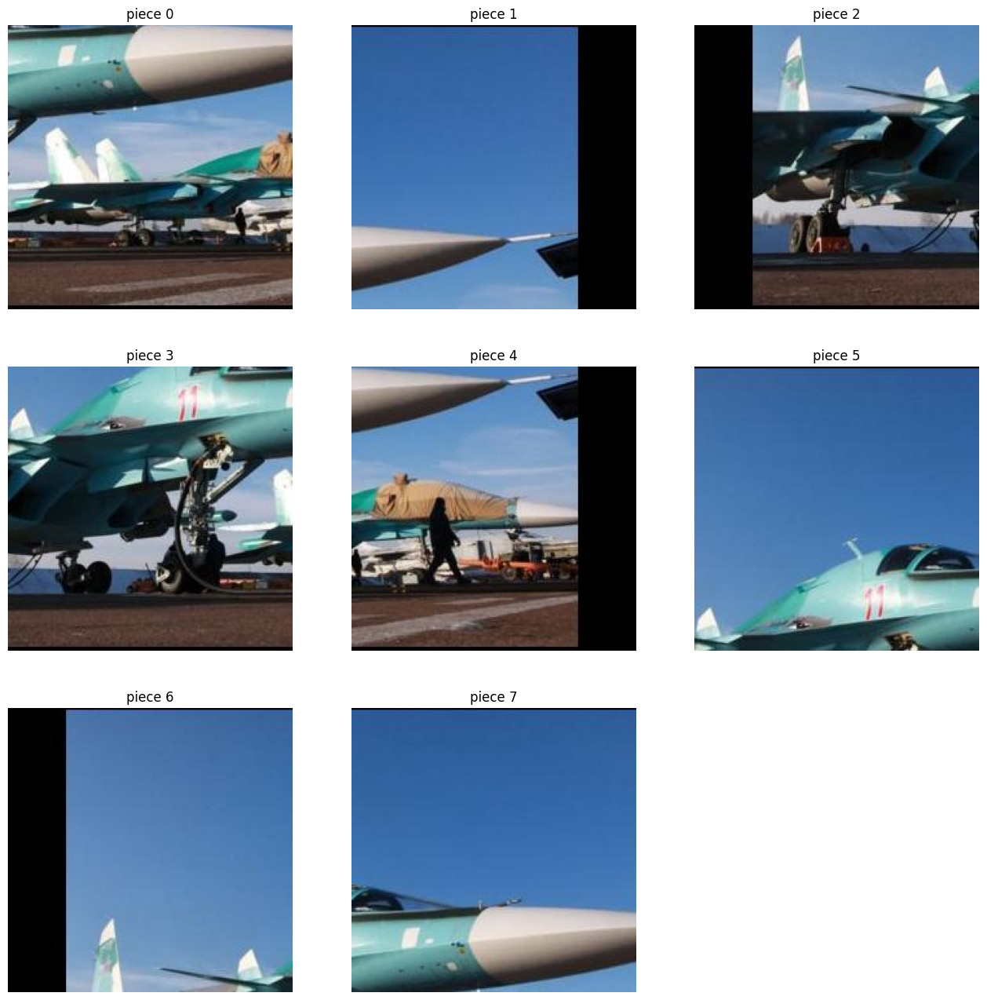

In [65]:
plot_images_grid(pieces, 'piece')

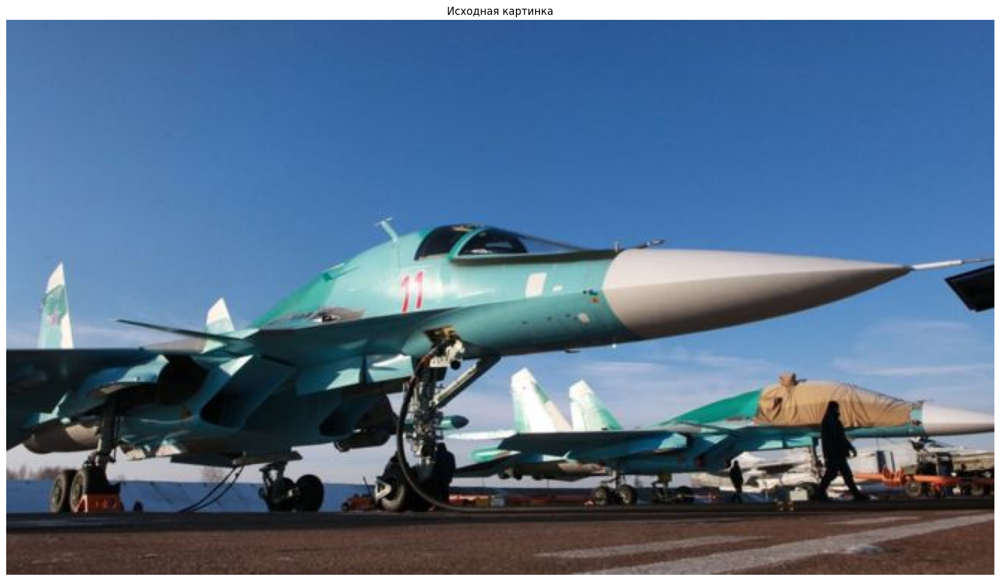

In [66]:
plot_one_image(real_image, 'Исходная картинка')

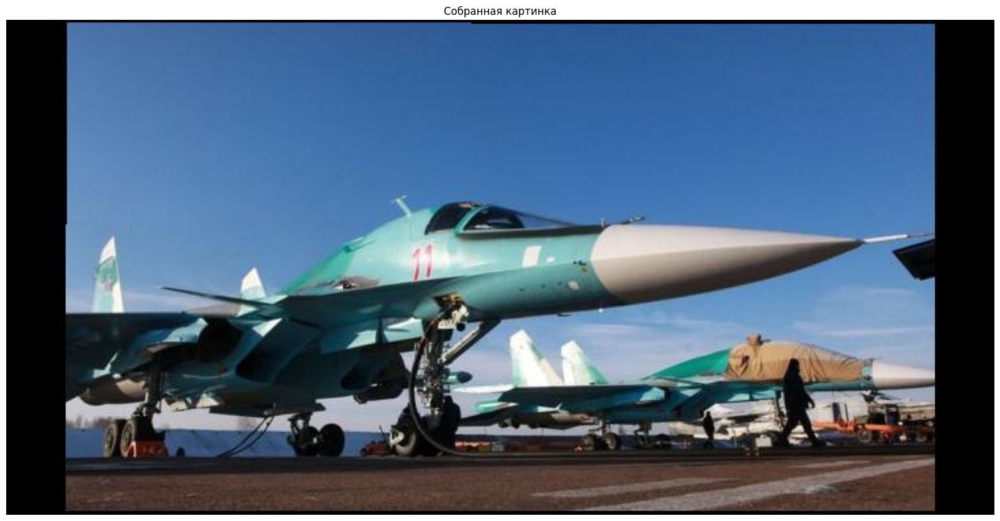

In [70]:
random.shuffle(pieces)
res_im = puzzle(pieces)
plot_one_image(res_im, 'Собранная картинка')

In [73]:
pieces = get_puzzle('china_shuffle')
real_image = cv2.imread("./puzzle/china.jpg")
real_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB)

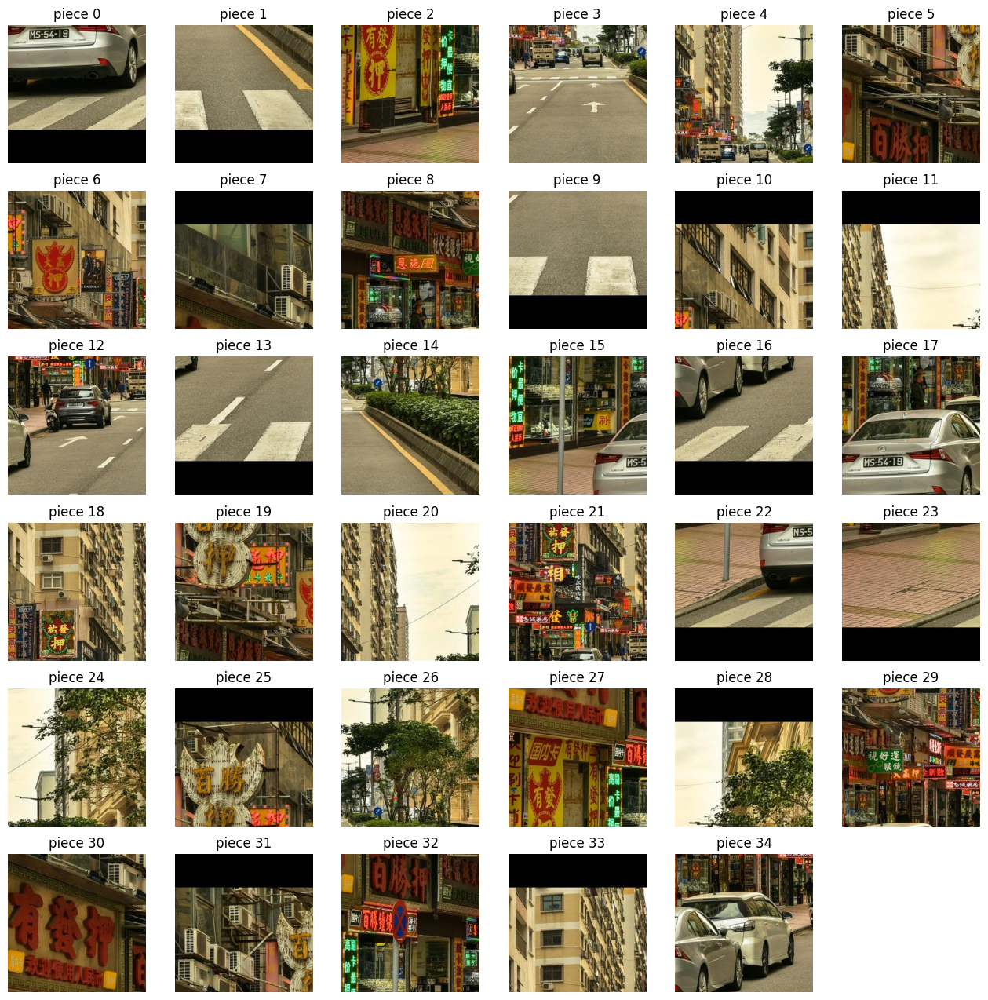

In [74]:
plot_images_grid(pieces, 'piece')

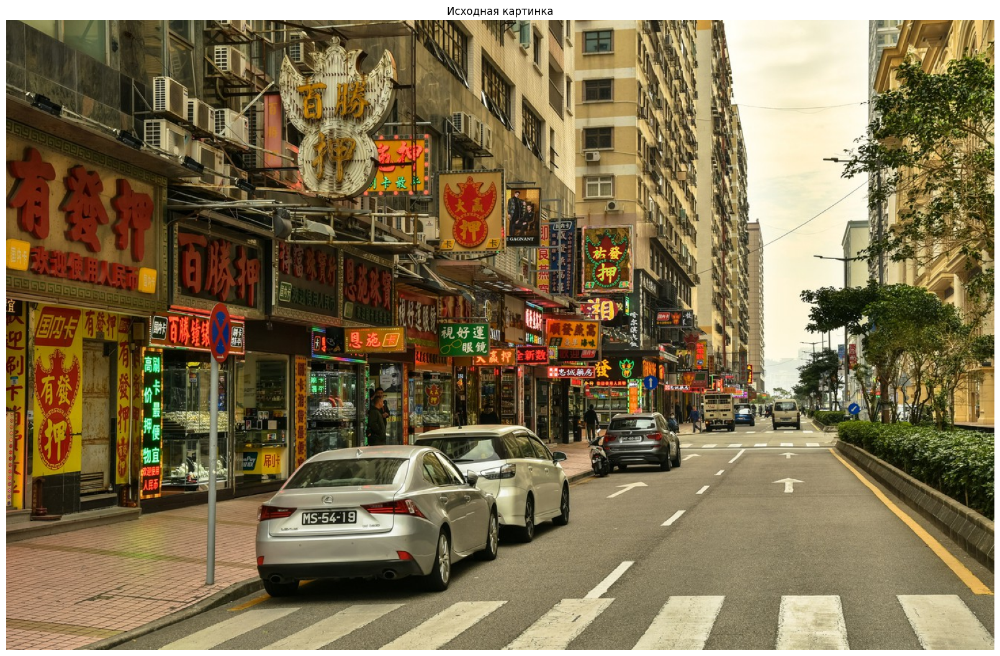

In [75]:
plot_one_image(real_image, 'Исходная картинка')

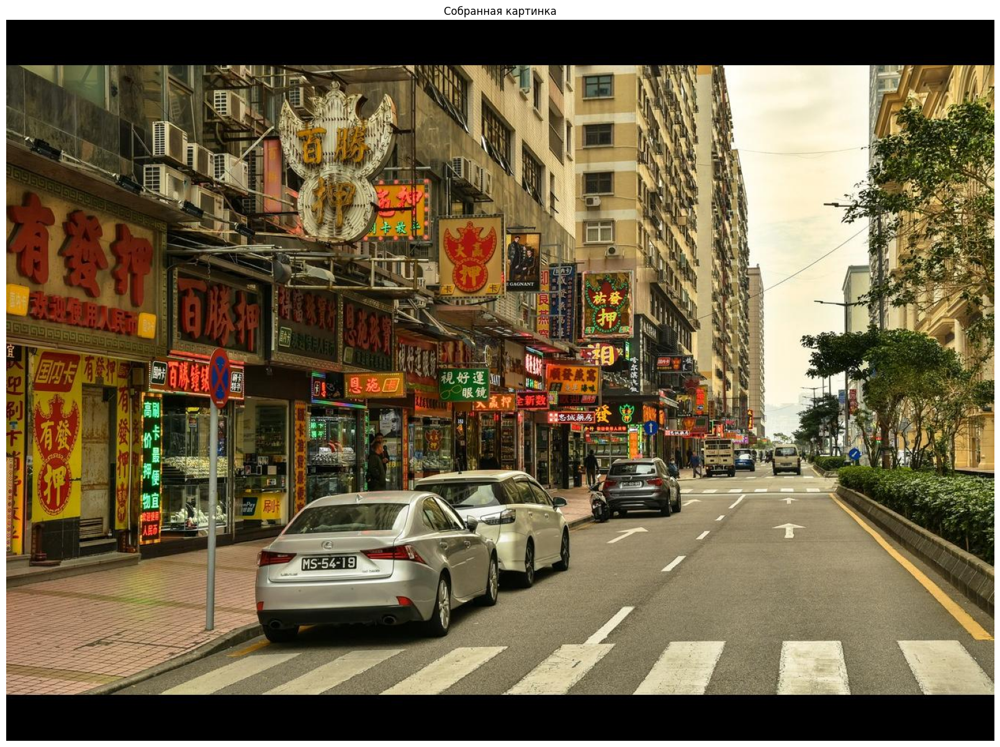

In [77]:
random.shuffle(pieces)
res_im = puzzle(pieces)
plot_one_image(res_im, 'Собранная картинка')

### Дом ~~я проклял~~  не получилось сделать 